In [1]:
import os
%pwd

'c:\\Users\\karthikeya\\New_Delhi_Reviews\\notebooks'

In [2]:
os.chdir('../')
%pwd

'c:\\Users\\karthikeya\\New_Delhi_Reviews'

In [3]:
import pandas as pd
df =pd.read_csv(r'artifacts\clustered_train_data.csv')

-----------------------------


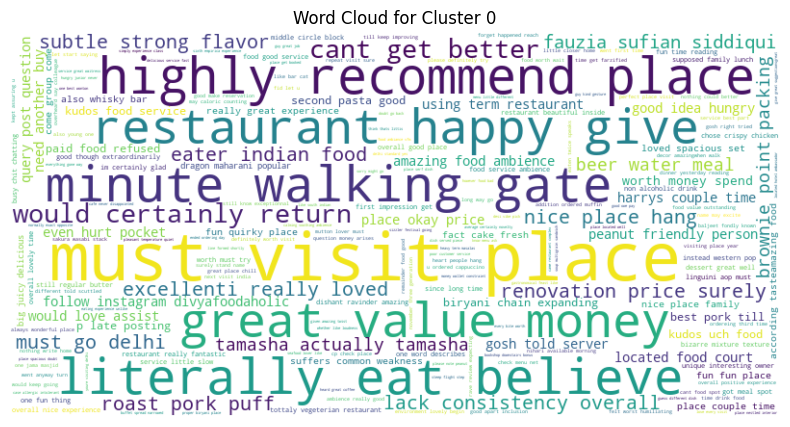

-----------------------------


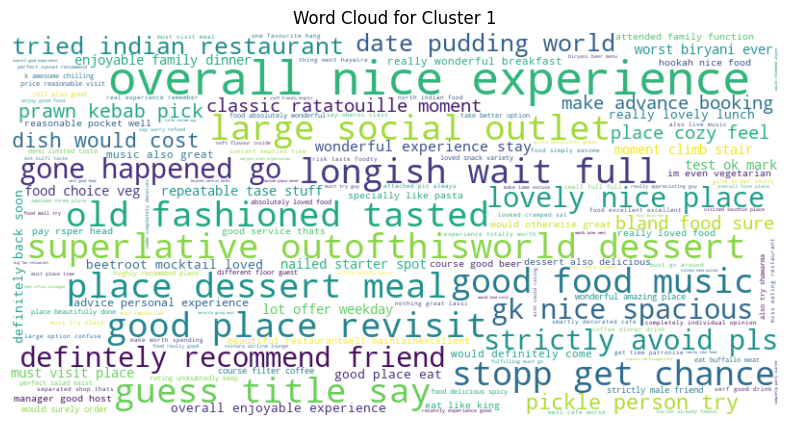

-----------------------------


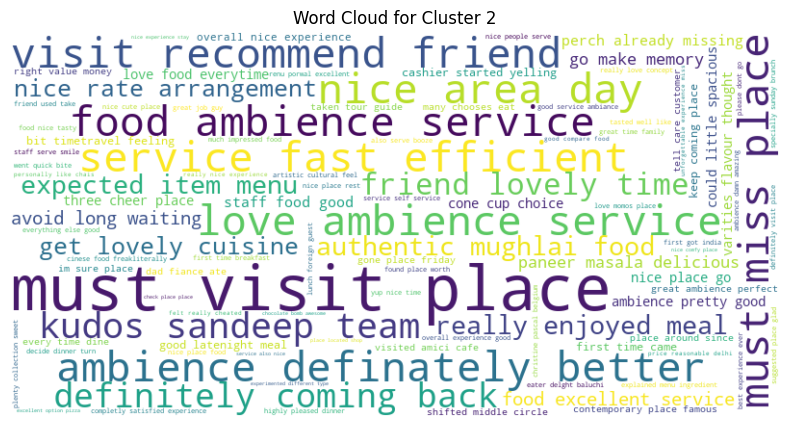

-----------------------------


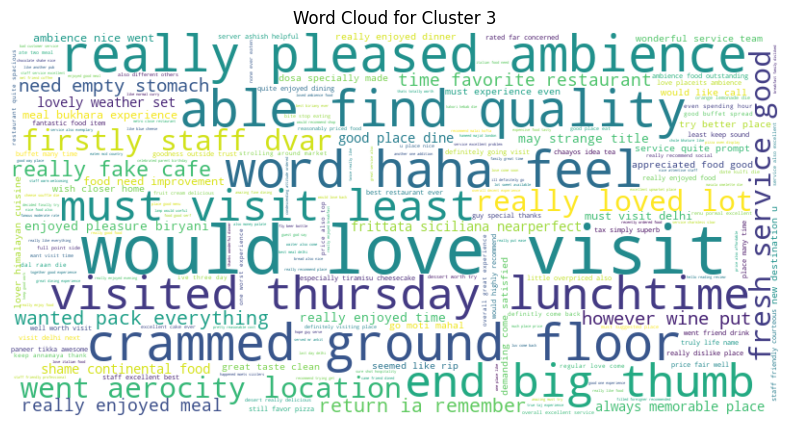

-----------------------------


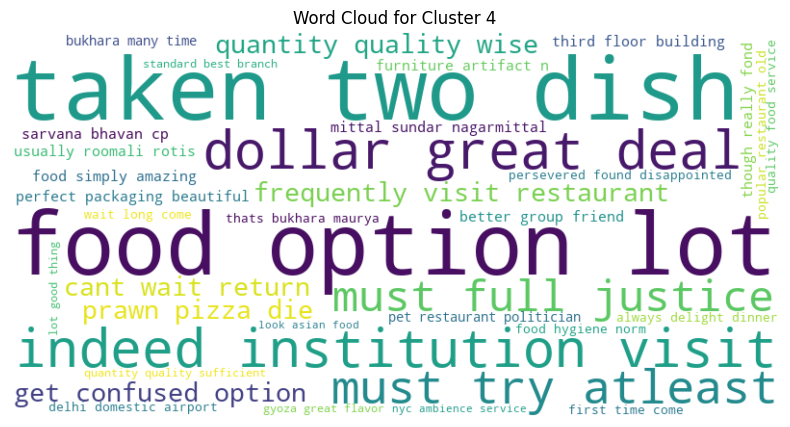

-----------------------------


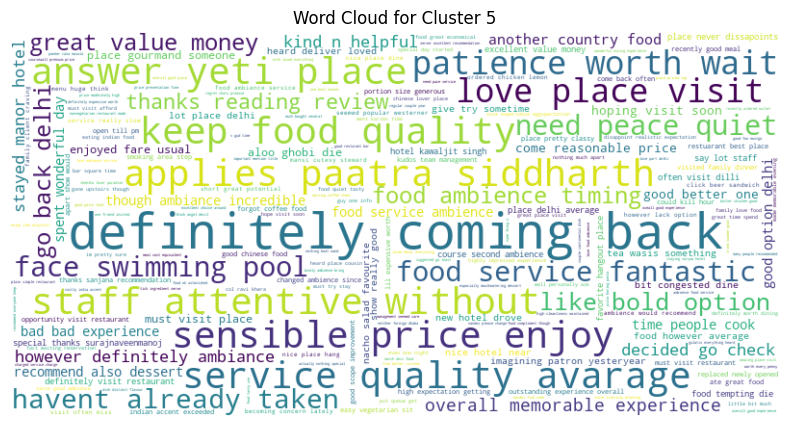

-----------------------------


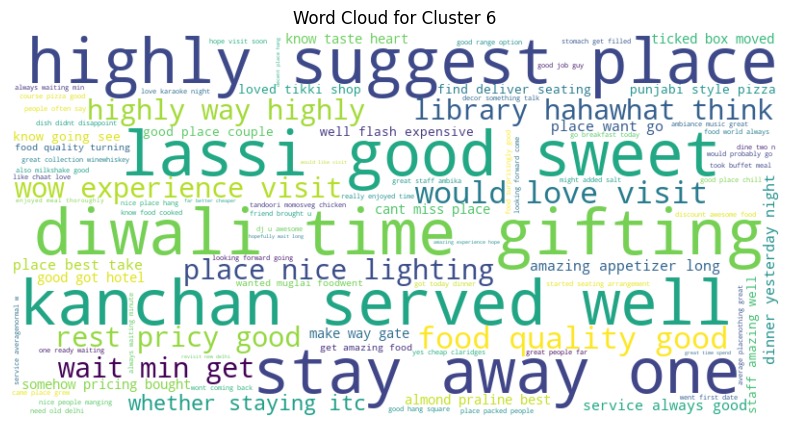

-----------------------------


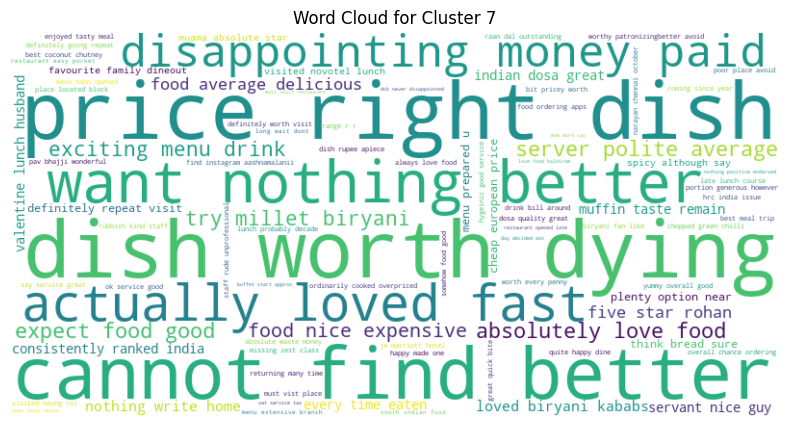

-----------------------------


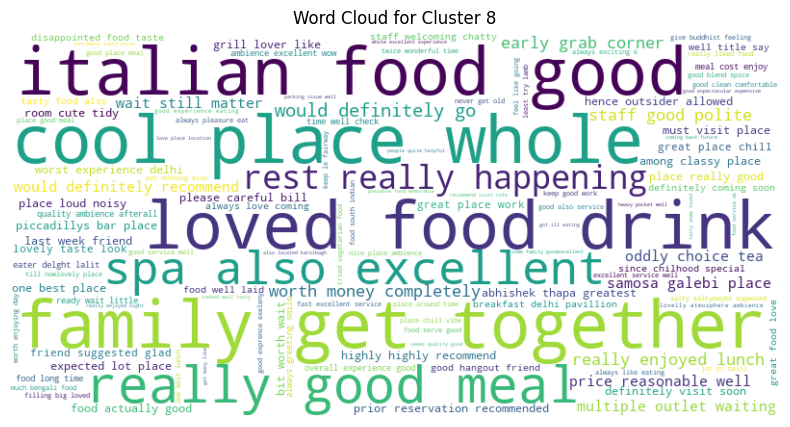

-----------------------------


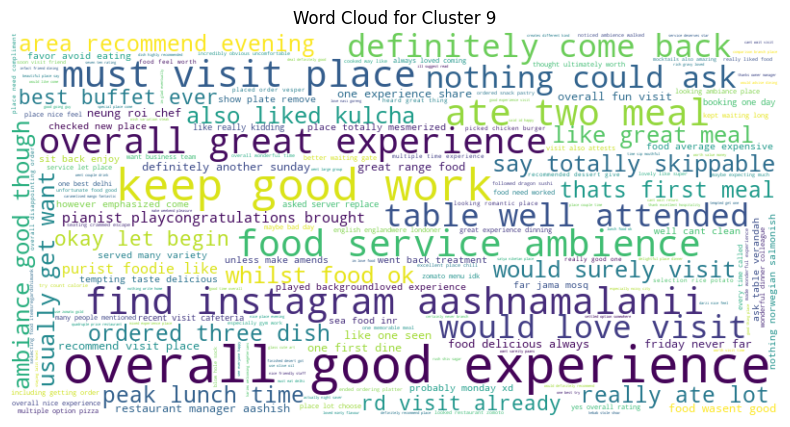

-----------------------------


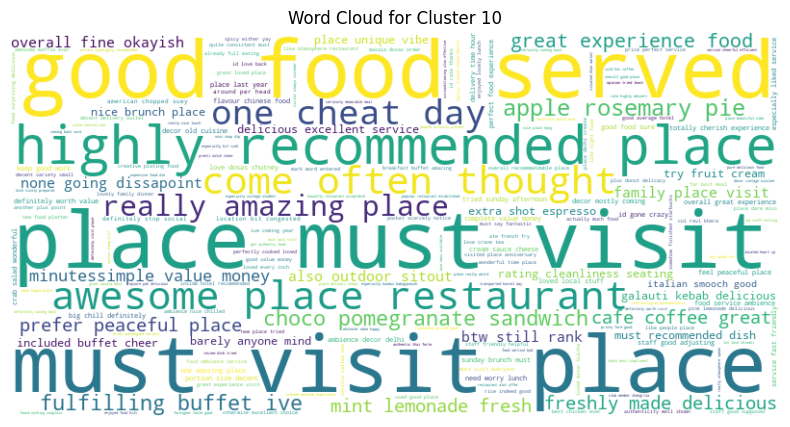

-----------------------------


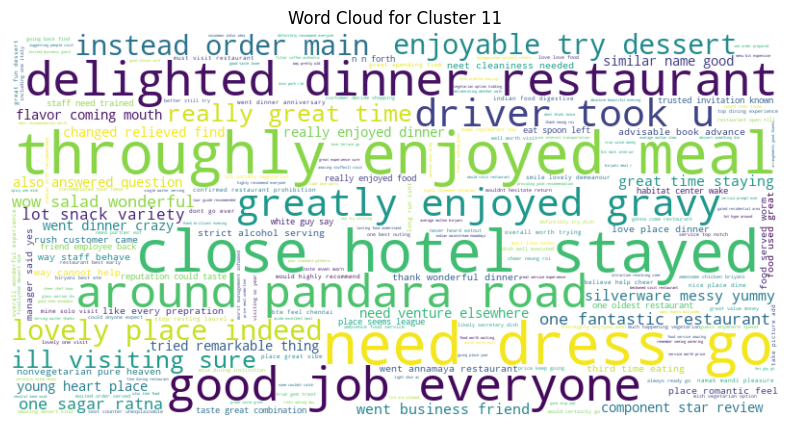

-----------------------------


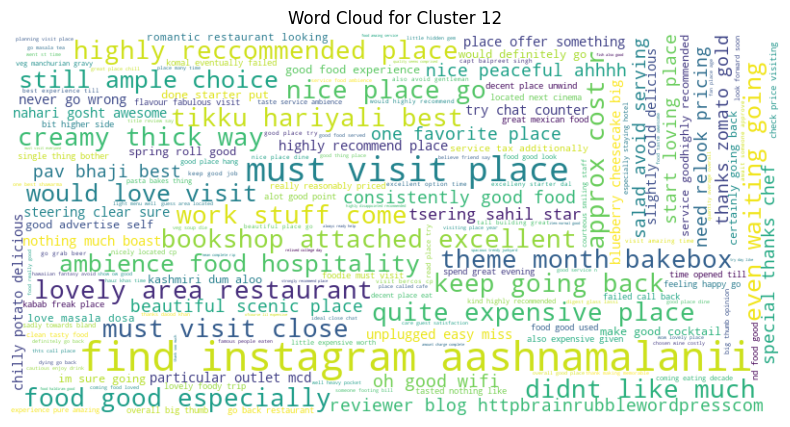

-----------------------------


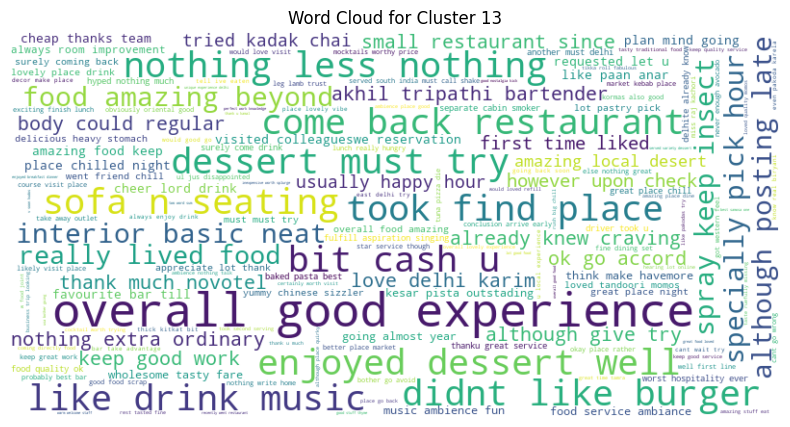

-----------------------------


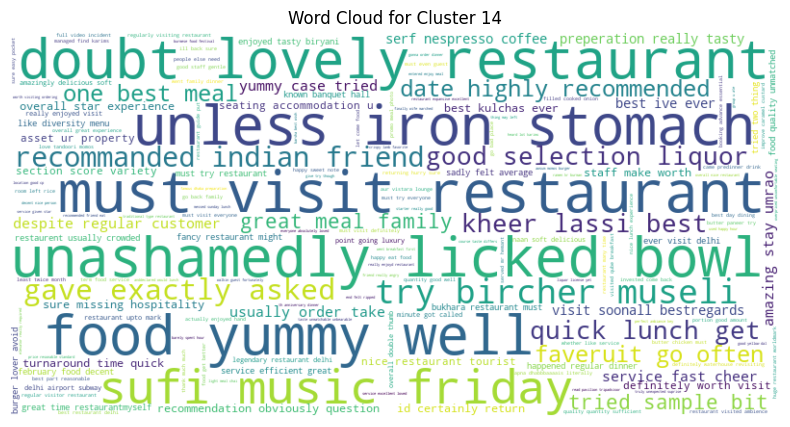

-----------------------------


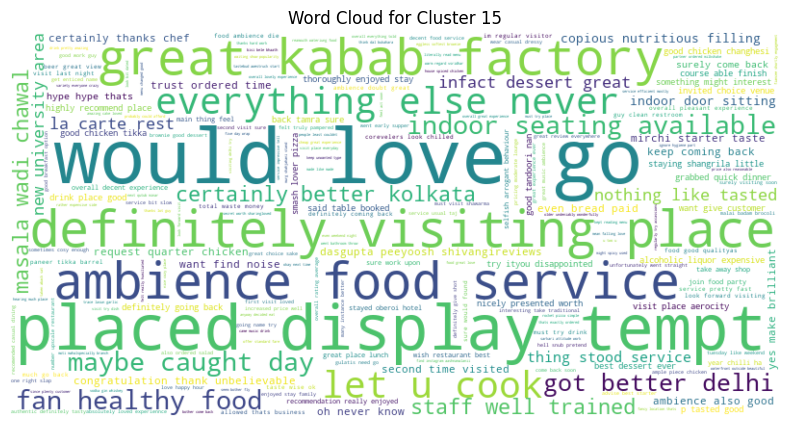

-----------------------------


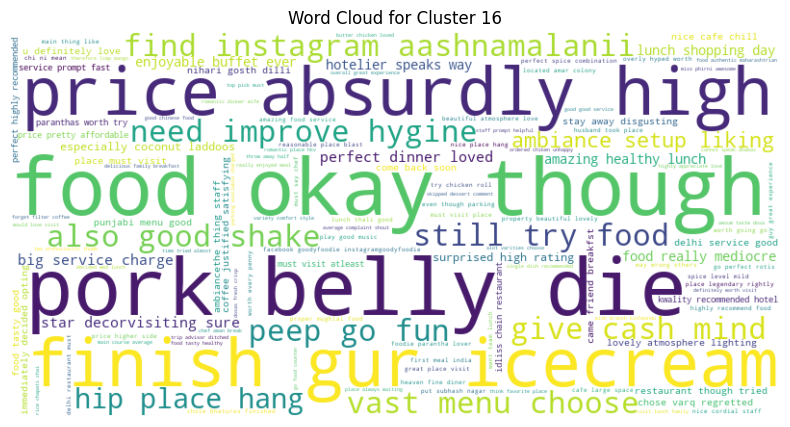

-----------------------------


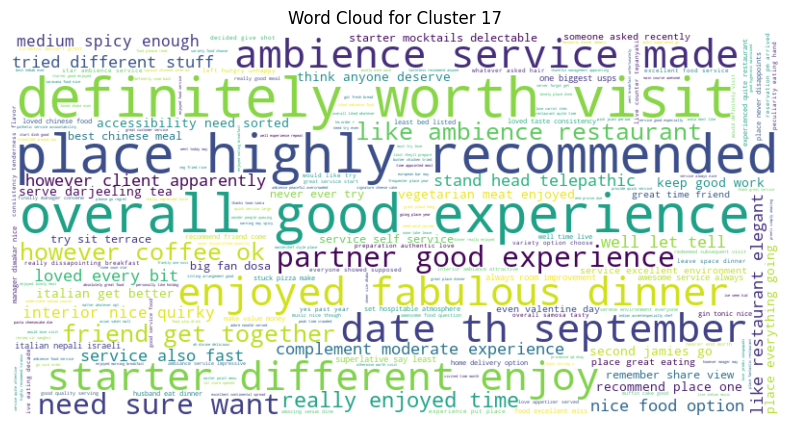

-----------------------------


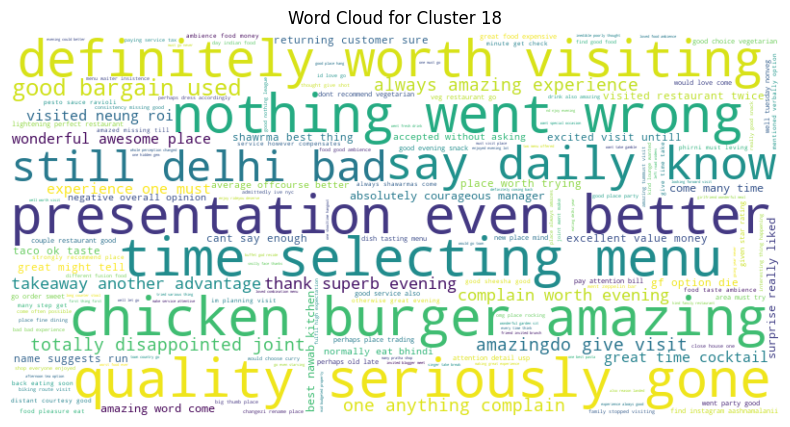

-----------------------------


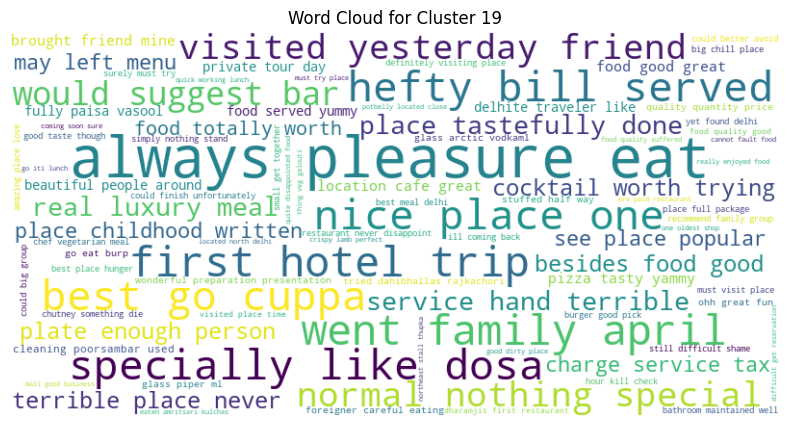

-----------------------------


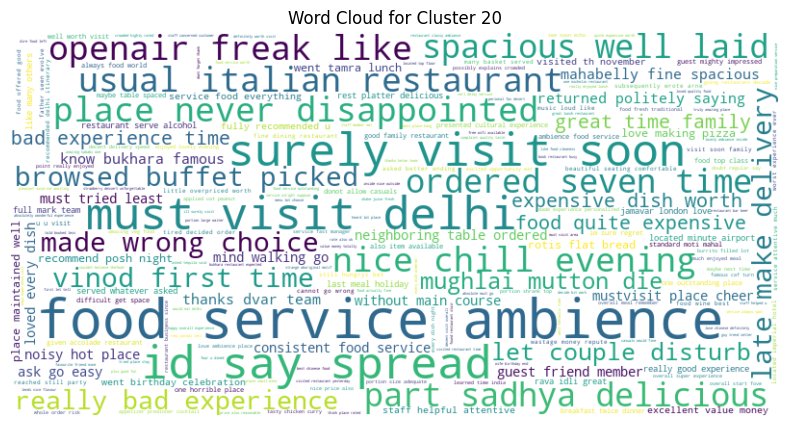

-----------------------------


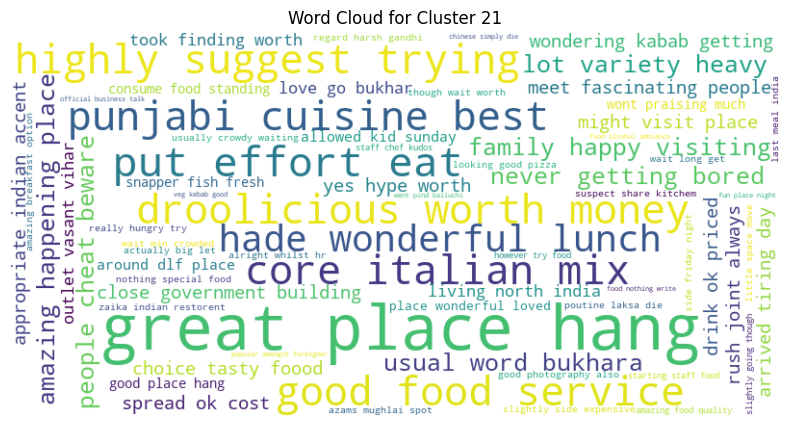

-----------------------------


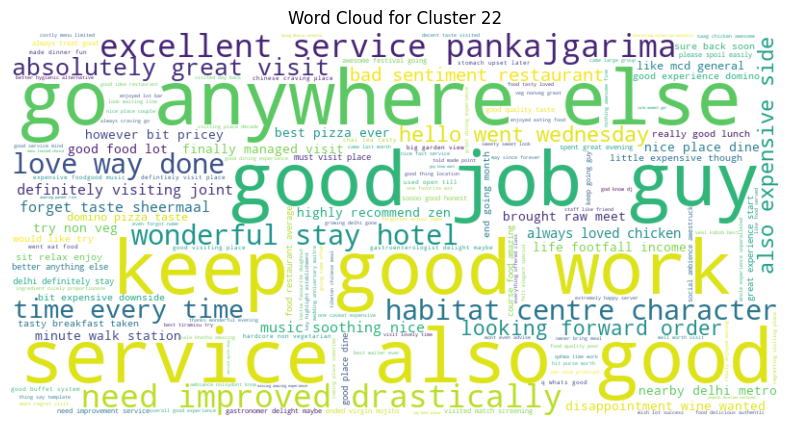

-----------------------------


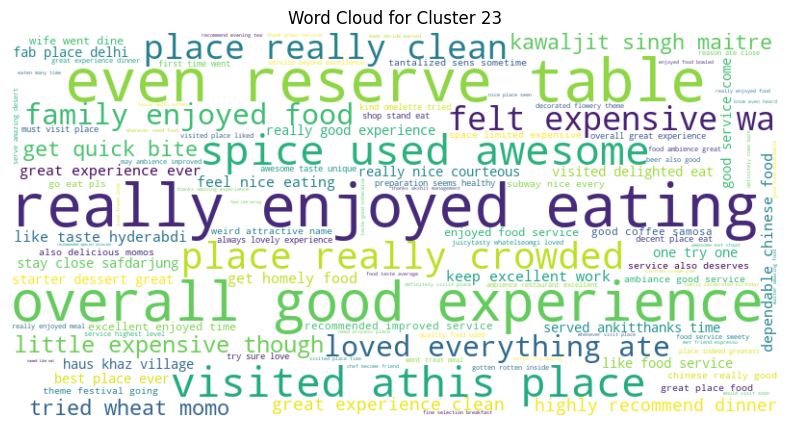

-----------------------------


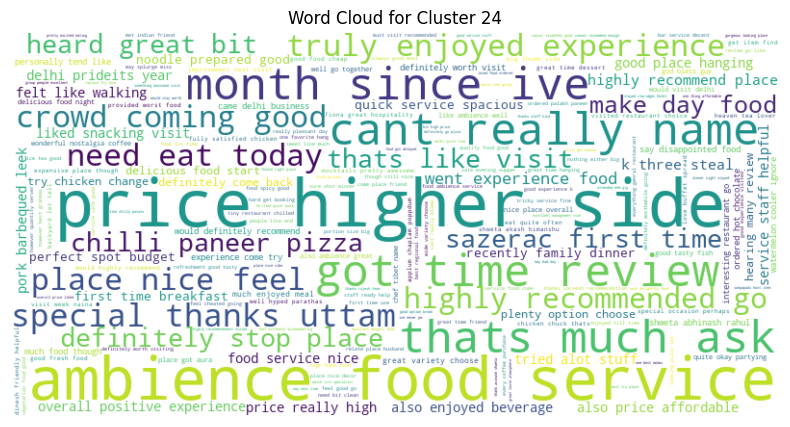

In [ ]:
from rake_nltk import Rake
from collections import Counter
from wordcloud import WordCloud
import matplotlib.pyplot as plt

for i in range(df['cluster_id'].nunique()):
    reviews = df[df['cluster_id'] == i]['review_full']
    # print(f"-----------------------------")
    # Initialize RAKE
    r = Rake(min_length=3, max_length=3, include_repeated_phrases=False)

    # Store keywords from each review
    all_keywords = []

    # Extract keywords from each review
    for review in reviews:
        r.extract_keywords_from_text(review)  # Pass the review as a single string
        # Add keywords from this review to the list
        keywords = r.get_ranked_phrases()
        all_keywords.extend(keywords)

    # Count occurrences of each keyword
    keyword_counts = Counter(all_keywords)

    # Get the most frequently occurring keywords
    top_keywords = keyword_counts.most_common(10)  # Adjust the number as needed

    # Print the results
    # print(f"Most Frequently Occurring Keywords Across Reviews of cluster id {i}:")
    # for keyword, count in top_keywords:
    #     print(f"{keyword}: {count}")

    # Create a word cloud
    wordcloud = WordCloud(
        width=800, height=400, 
        background_color='white', 
        colormap='viridis'
    ).generate_from_frequencies(keyword_counts)

    # Display the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f"Word Cloud for Cluster {i}")
    plt.axis('off')
    plt.show()


In [3]:
import pandas as pd
import numpy as np

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.pipeline import Pipeline

from src.logger import logger
from src.components.data_ingestion import DataIngestionConfig, DataIngestion
from src.components.text_data_transformation import DataTransformation, remove_stop_words, lemmatization, DataTransformationConfig
from src.components.data_clustering import ClusterModelling, ModellingConfig

from rake_nltk import Rake



In [4]:
data_ingestion =DataIngestion()
tr_data_path, ts_data_path = data_ingestion.initate_data_ingestion()

[2024-12-26 12:33:42,146, data_ingestion, INFO, Initiating data ingestion ]
[2024-12-26 12:33:42,148, data_ingestion, INFO, Establising Connection With SQL Database ]
[2024-12-26 12:33:42,152, data_ingestion, INFO, Successfully connected to the SQLite database. ]
[2024-12-26 12:33:42,155, data_ingestion, INFO, Reading New_Delhi_Reviews table  ]
[2024-12-26 12:33:42,627, data_ingestion, INFO, Successfully read the New_Delhi_Reviews as pandas dataframe ]
[2024-12-26 12:33:44,141, data_ingestion, INFO, succesfully ingested the raw data as a csv file into artifacts\raw_data.csv ]
[2024-12-26 12:33:44,142, data_ingestion, INFO, Initiating train test split ]
[2024-12-26 12:33:45,702, data_ingestion, INFO, train and test data split successful and stored respectively as csv files at artifacts\train_data.csv, artifacts\test_data.csv ]


In [5]:
data_trans_config = DataTransformationConfig()
data_trans = DataTransformation()
tr_data, ts_data = data_trans.initiate_data_transformation(tr_data_path, ts_data_path)

[2024-12-26 12:34:36,464, text_data_transformation, INFO, Initiating the DataTransformation ]
[2024-12-26 12:34:36,466, text_data_transformation, INFO, Initiatig data transformation pipeline ]
[2024-12-26 12:34:38,043, text_data_transformation, INFO, Getting set of stopwords from NLTK for English language ]
[2024-12-26 12:34:38,046, text_data_transformation, INFO, Instantiating WordNetLemmatizer from NLTK ]
[2024-12-26 12:34:38,046, text_data_transformation, INFO, Loading Gensim Word2Vec model for embedding generation ]
[2024-12-26 12:34:38,048, keyedvectors, INFO, loading projection weights from ft_reviews_vectors.bin ]
[2024-12-26 12:34:39,246, utils, INFO, KeyedVectors lifecycle event {'msg': 'loaded (106574, 25) matrix of type float32 from ft_reviews_vectors.bin', 'binary': True, 'encoding': 'utf8', 'datetime': '2024-12-26T12:34:39.246112', 'gensim': '4.3.3', 'python': '3.9.21 | packaged by conda-forge | (main, Dec  5 2024, 13:41:22) [MSC v.1929 64 bit (AMD64)]', 'platform': 'Windo

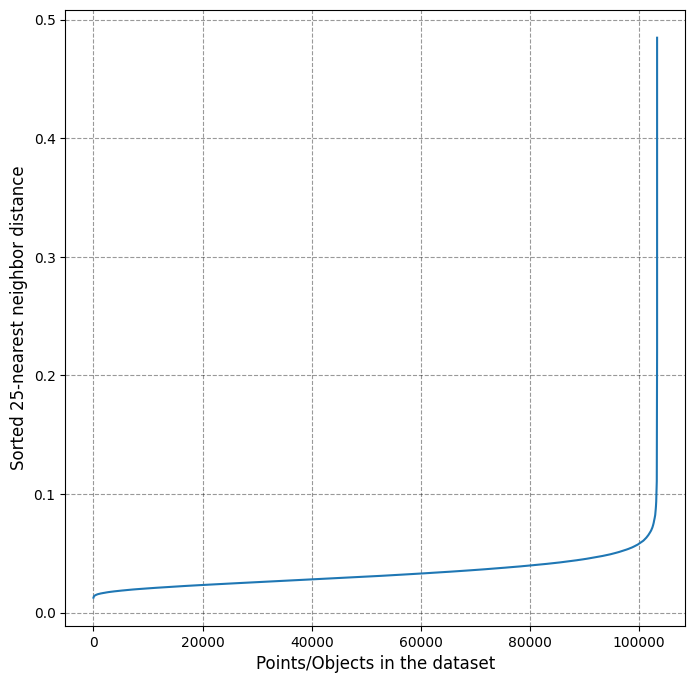

In [6]:
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors

def get_kdist_plot(X=None, k=None, radius_nbrs=1.0):

    nbrs = NearestNeighbors(n_neighbors=k, radius=radius_nbrs).fit(X)

    # For each point, compute distances to its k-nearest neighbors
    distances, indices = nbrs.kneighbors(X) 
                                       
    distances = np.sort(distances, axis=0)
    distances = distances[:, k-1]

    # Plot the sorted K-nearest neighbor distance for each point in the dataset
    plt.figure(figsize=(8,8))
    plt.plot(distances)
    plt.xlabel('Points/Objects in the dataset', fontsize=12)
    plt.ylabel('Sorted {}-nearest neighbor distance'.format(k), fontsize=12)
    plt.grid(True, linestyle="--", color='black', alpha=0.4)
    plt.show()
    plt.close()

k = 2 * input_feature_arr.shape[-1] - 1 # k=2*{dim(dataset)} - 1
get_kdist_plot(X=input_feature_arr, k=25)
plt.show()

In [6]:
clustering =Cluster_Modelling()
clustering.initiate_clustering(tr_data, ts_data)

[2024-12-26 12:47:02,699, data_clustering, INFO, Initialized clustering model ]
[2024-12-26 12:47:02,700, data_clustering, INFO, Initiating the UMAP model for dimensionality reduction ]
[2024-12-26 12:47:02,702, data_clustering, INFO, Initializing the K-Means clustering model ]
[2024-12-26 12:47:02,704, data_clustering, INFO, Fitting the training data to the clustering model ]
[2024-12-26 12:47:02,705, data_clustering, INFO, Fitting the UMAP to the given data ]
[2024-12-26 12:49:41,430, data_clustering, INFO, Fitting the data to the K-Means cluster model ]
[2024-12-26 12:49:41,833, data_clustering, INFO, Transforming the data using the K-Means clustering model ]
[2024-12-26 12:49:41,945, data_clustering, INFO, Successfully assigned clusters using K-Means ]
[2024-12-26 12:49:41,947, data_clustering, INFO, saving fitted cluster model at artifacts\cluster_model.joblib ]
[2024-12-26 12:50:03,311, data_clustering, INFO, Transforming the test data to ]
[2024-12-26 12:50:03,312, data_clusteri

(array([2, 3, 4, ..., 0, 0, 1]), array([1, 2, 1, ..., 2, 0, 0]))

In [7]:
from src.constants import text_columns

In [4]:
class CleanText:

    def __init__(self):

        try:
            logger.info(f"Ingesting the data for cleaning process")
            self.model_config = ModellingConfig()
            pass
        except Exception as e:
            logger.info("Error initiating the cleaning text class :{e}")
            raise e
        

    def get_cleaning_text_object(self):
        
        try:
            logger.info(f" Initiating the text cleaning pipeline")
            cleaning_pipe = Pipeline(
                [
                    ('remove_stop_words', remove_stop_words()),
                    ('lemmatize_words', lemmatization()),
                    ('vectorizer', CountVectorizer(max_df=0.75, min_df=5)),
                    ('Topic Modelling', LatentDirichletAllocation(n_components=5, learning_method='online', n_jobs=-1, random_state=42))
                ]
            )
            return cleaning_pipe
        except Exception as e:
            logger.info(f"Error initiating the text cleaning pipeline :{e}")
            raise e
        

    def initiate_cleaning_text_data(self):
+9
        try:
            logger.info(f"Reading clustered train data and test from {self.model_config.clustered_train_data_path}, {self.model_config.clustered_test_data_path}")
            
            train_df = pd.read_csv(self.model_config.clustered_train_data_path)
            test_df = pd.read_csv(self.model_config.clustered_test_data_path)

            

        except Exception as e:
            raise e

In [4]:
model_config = ModellingConfig()

tr_data_path, ts_data_path = model_config.clustered_train_data_path, model_config.clustered_test_data_path

tr_data = pd.read_csv(tr_data_path)
ts_data = pd.read_csv(ts_data_path)

In [5]:
cleaning_pipe = Pipeline(
    [
        ('remove_stop_words', remove_stop_words()),
        ('lemmatize_words', lemmatization()),
        ('vectorizer', TfidfVectorizer(lowercase=False, stop_words='english', max_df=0.75, min_df=10, use_idf=True, ngram_range=(2,2))),
        ('Topic Modelling', LatentDirichletAllocation())
    ]

)

[2024-12-29 18:06:12,439, text_data_transformation, INFO, Getting set of stopwords from NLTK for English language ]
[2024-12-29 18:06:12,443, text_data_transformation, INFO, Instantiating WordNetLemmatizer from NLTK ]


In [1]:
tr_data['cluster_id'].value_counts()

NameError: name 'tr_data' is not defined

In [7]:
tr_data['cluster_id'].nunique()

25

In [8]:
tr_data[tr_data['cluster_id']==10]['review_full']

17        Ambience is Nice(nothing much diff. Than rest ...
25        Went for Lunch with with a friend's family dur...
45        Service was very good tasty and delicious food...
50        Have you had the honey chili potato? Mmmm. Don...
52        It is not every day that you get to enjoy lunc...
                                ...                        
103233    Enjoyed the food at annamya, especially my fav...
103238    From the warm smiles , to the perfect suggesti...
103244    This is the finest Restaurant for North Indian...
103249    It's our first day in New Dehli and after a vi...
103258    Cozy ambience to mimic Punjab street food.  On...
Name: review_full, Length: 5370, dtype: object

In [9]:
import numpy as np
from gensim.models import CoherenceModel
from gensim.corpora import Dictionary
from skopt import BayesSearchCV
from skopt.space import Integer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.pipeline import Pipeline

# Define your coherence_score function (as you've provided)
def coherence_score(estimator, X, coherence_measure='c_v'):
    # Tokenize and prepare the corpus
    tokenized_texts = [text.split() for text in X]  # Assuming X is a list of strings
    dictionary = Dictionary(tokenized_texts)
    # corpus = [dictionary.doc2bow(text) for text in tokenized_texts]
    
    # Fit the model (ensure it is fitted first)
    estimator.fit(X)
    
    # Access the LDA model from the pipeline
    lda_model = estimator.named_steps["Topic Modelling"]
    
    # Get the topic-word distributions (this is what Gensim uses as topics)
    topics = lda_model.components_  # This is a (n_components, n_features) matrix
    
    # Convert it to a format Gensim can work with
    # Create a dummy LDA model using Gensim (the topics are manually set)
    gensim_lda_model = GensimLdaModel(topics, num_topics=lda_model.n_components, id2word=dictionary)
    
    # Compute the coherence score
    coherence_model = CoherenceModel(
        model=gensim_lda_model,
        texts=tokenized_texts,
        dictionary=dictionary,
        coherence=coherence_measure
    )
    return coherence_model.get_coherence()

# Define a simple Gensim-compatible wrapper around the LDA model
class GensimLdaModel:
    def __init__(self, topic_word_distributions, num_topics, id2word):
        self.num_topics = num_topics
        self.id2word = id2word
        self.topic_word_distributions = topic_word_distributions

    def get_topics(self):
        # Gensim expects topics to be in a (num_topics, num_words) format
        return self.topic_word_distributions

# Define the pipeline with LDA model
lda = cleaning_pipe.named_steps['Topic Modelling']

# Define the parameter search space for BayesSearchCV
param_space = {
    'Topic Modelling__n_components': (2, 10),  # Number of topics, to be optimized in the range [2, 20]
    'Topic Modelling__doc_topic_prior': (1e-4, 1e-1, 'log-uniform'),  # Dirichlet prior for documents (log-uniform)
    'Topic Modelling__topic_word_prior': (1e-3, 1e-1, 'log-uniform'),  # Dirichlet prior for words (log-uniform)
}

# Use the coherence_score function as the custom scoring method
def coherence_scorer(estimator, X):
    return coherence_score(estimator, X, coherence_measure='c_v')

# Set up BayesSearchCV with custom scoring function
bayes_search = BayesSearchCV(
    cleaning_pipe,
    param_space,
    n_iter=10,  # Number of search iterations
    scoring=coherence_scorer,  # Use coherence score as scoring function
    cv=3,  # Cross-validation
    verbose=1,
    random_state=42
)

# Fit BayesSearchCV
bayes_search.fit(tr_data[tr_data['cluster_id'] == 1]['review_full'])

# Print the best parameters and best score
print("Best parameters found: ", bayes_search.best_params_)
print("Best coherence score: ", bayes_search.best_score_)

# Compute coherence score with the best model
best_model = bayes_search.best_estimator_
score = coherence_score(best_model, tr_data[tr_data['cluster_id'] == 1]['review_full'])
print("Final coherence score: ", score)


[2024-12-29 18:06:22,729, text_data_transformation, INFO, Getting set of stopwords from NLTK for English language ]
[2024-12-29 18:06:22,731, text_data_transformation, INFO, Instantiating WordNetLemmatizer from NLTK ]
Fitting 3 folds for each of 1 candidates, totalling 3 fits
[2024-12-29 18:06:22,755, text_data_transformation, INFO, Getting set of stopwords from NLTK for English language ]
[2024-12-29 18:06:22,757, text_data_transformation, INFO, Instantiating WordNetLemmatizer from NLTK ]
[2024-12-29 18:06:22,762, text_data_transformation, INFO, Transforming all the letters into lowercase ]
[2024-12-29 18:06:22,768, text_data_transformation, INFO, Tokenizing and removing stopwords ]
[2024-12-29 18:06:23,008, text_data_transformation, INFO, Text cleaning and stopword removal successful ]
[2024-12-29 18:06:23,009, text_data_transformation, INFO, Lemmatizing the words ]
[2024-12-29 18:06:28,757, text_data_transformation, INFO, Lemmatization successful ]
[2024-12-29 18:06:32,229, dictiona

In [25]:
best_model

Pipeline(steps=[('remove_stop_words', remove_stop_words()),
                ('lemmatize_words', lemmatization()),
                ('vectorizer',
                 TfidfVectorizer(lowercase=False, max_df=0.75, min_df=10,
                                 ngram_range=(2, 2), stop_words='english')),
                ('Topic Modelling',
                 LatentDirichletAllocation(doc_topic_prior=0.027364528220782454,
                                           n_components=3,
                                           topic_word_prior=0.01570703295827246))])

In [10]:
best_model.fit_transform(tr_data[tr_data['cluster_id'] == 10]['review_full'])

[2024-12-29 18:17:53,457, text_data_transformation, INFO, Transforming all the letters into lowercase ]
[2024-12-29 18:17:53,471, text_data_transformation, INFO, Tokenizing and removing stopwords ]
[2024-12-29 18:17:53,948, text_data_transformation, INFO, Text cleaning and stopword removal successful ]
[2024-12-29 18:17:53,950, text_data_transformation, INFO, Lemmatizing the words ]
[2024-12-29 18:17:55,283, text_data_transformation, INFO, Lemmatization successful ]


array([[0.01838459, 0.01838459, 0.96323083],
       [0.00889972, 0.36393149, 0.62716879],
       [0.97614538, 0.01192731, 0.01192731],
       ...,
       [0.00900189, 0.00900189, 0.98199622],
       [0.48410303, 0.50781407, 0.0080829 ],
       [0.01848033, 0.96303934, 0.01848033]])

In [22]:
import pyLDAvis
import pyLDAvis.lda_model


# Assuming best_model is your trained pipeline
# Make sure the vectorizer is part of your pipeline
vectorizer = best_model.named_steps['vectorizer']  # Access vectorizer in the pipeline
lda_model = best_model.named_steps['Topic Modelling']  # Access LDA model in the pipeline

# Prepare the data (make sure 'review_full' column contains the text data)
X = tr_data[tr_data['cluster_id'] == 10]['review_full']  # Filter your data for a specific cluster or use the full dataset

# Create the pyLDAvis visualization using sklearn interface
vis = pyLDAvis.lda_model.prepare(lda_model, vectorizer.transform(X), vectorizer)

# Display the visualization
pyLDAvis.display(vis)


In [23]:
best_model.fit_transform(tr_data[tr_data['cluster_id'] == 10]['review_full'])

[2024-12-29 18:29:18,576, text_data_transformation, INFO, Transforming all the letters into lowercase ]
[2024-12-29 18:29:18,584, text_data_transformation, INFO, Tokenizing and removing stopwords ]
[2024-12-29 18:29:18,918, text_data_transformation, INFO, Text cleaning and stopword removal successful ]
[2024-12-29 18:29:18,919, text_data_transformation, INFO, Lemmatizing the words ]
[2024-12-29 18:29:20,243, text_data_transformation, INFO, Lemmatization successful ]


array([[0.96323083, 0.01838459, 0.01838459],
       [0.98220055, 0.00889972, 0.00889972],
       [0.01192731, 0.01192731, 0.97614538],
       ...,
       [0.00900189, 0.98199622, 0.00900189],
       [0.0080829 , 0.73252194, 0.25939516],
       [0.96303934, 0.01848033, 0.01848033]])

In [26]:
feature_names = best_model.named_steps['vectorizer'].get_feature_names_out()


lda = best_model.named_steps['Topic Modelling']
for idx, topic in enumerate(lda.components_):
    print(f"Topic {idx}:")
    print([feature_names[i] for i in topic.argsort()[:-10 - 1:-1]])


Topic 0:
['food good', 'good food', 'non veg', 'good service', 'chinese food', 'food service', 'service good', 'indian food', 'food quality', 'main course']
Topic 1:
['butter chicken', 'main course', 'food good', 'indian accent', 'indian food', 'food drink', 'tasting menu', 'nice place', 'non veg', 'north indian']
Topic 2:
['south indian', 'indian food', 'authentic south', 'north indian', 'visit place', 'indian cuisine', 'highly recommend', 'new delhi', 'mouth watering', 'saravana bhavan']


In [32]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

In [34]:
tr_data = pd.read_csv(data_trans_config.transformed_train_file)
ts_data = pd.read_csv(data_trans_config.transformed_test_file)

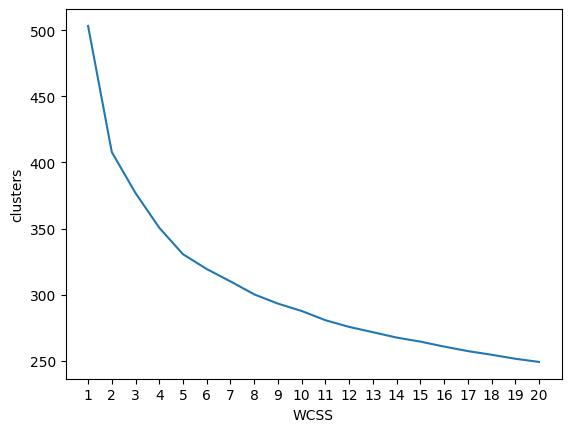

In [42]:
wcss = []

for i in range(1, 21, 1):
    cluster =KMeans(n_clusters=i)
    cluster.fit_transform(X=tr_data )
    wcss.append(cluster.inertia_)
plt.plot(range(1,21), wcss)
plt.xlabel('WCSS')
plt.ylabel('clusters')
plt.xticks(range(1,21));

In [80]:
cleaning_pipe.fit_transform(tr_data[tr_data['cluster_id']==1]['review_full'])

[2024-12-26 17:07:28,552, text_data_transformation, INFO, Transforming all the letters into lowercase ]
[2024-12-26 17:07:28,579, text_data_transformation, INFO, Tokenizing and removing stopwords ]
[2024-12-26 17:07:29,761, text_data_transformation, INFO, Text cleaning and stopword removal successful ]
[2024-12-26 17:07:29,762, text_data_transformation, INFO, Lemmatizing the words ]
[2024-12-26 17:07:33,939, text_data_transformation, INFO, Lemmatization successful ]


array([[0.0159171 , 0.01591647, 0.01591573, ..., 0.85675642, 0.01591571,
        0.01591571],
       [0.03117697, 0.03117446, 0.03117446, ..., 0.27800067, 0.03117446,
        0.03117446],
       [0.02774631, 0.02774895, 0.02775253, ..., 0.02775004, 0.75027063,
        0.02774631],
       ...,
       [0.35222885, 0.02161135, 0.02161127, ..., 0.36475435, 0.02161331,
        0.02162037],
       [0.54729946, 0.0245443 , 0.25636412, ..., 0.02454648, 0.02454174,
        0.02454088],
       [0.34151798, 0.07117511, 0.08680791, ..., 0.29073555, 0.02262261,
        0.02262261]])

In [81]:
feature_names = cleaning_pipe.named_steps['vectorizer'].get_feature_names_out()


lda = cleaning_pipe.named_steps['Topic Modelling']
for idx, topic in enumerate(lda.components_):
    print(f"Topic {idx}:")
    print([feature_names[i] for i in topic.argsort()[:-10 - 1:-1]])


Topic 0:
['really good', 'nice place', 'place really', 'food good', 'good food', 'good ambience', 'food place', 'good place', 'place hang', 'really nice']
Topic 1:
['food great', 'staff helpful', 'italian food', 'service excellent', 'big chill', 'excellent staff', 'great service', 'special thanks', 'food excellent', 'food delicious']
Topic 2:
['time food', 'staff polite', 'ambience food', 'service charge', 'place perfect', 'food ambiance', 'seekh kebab', 'great meal', 'menu good', 'lot place']
Topic 3:
['definitely come', 'food court', 'food specially', 'taken care', 'nice service', 'best restaurant', 'want eat', 'hospitality good', 'hong kong', 'chinese restaurant']
Topic 4:
['south indian', 'indian food', 'jama masjid', 'really tasty', 'great hospitality', 'filter coffee', 'amazing service', 'mughlai food', 'indian dish', 'price good']
Topic 5:
['absolutely delicious', 'chill friend', 'chicken dish', 'good care', 'helpful food', 'staying hotel', 'new place', 'place visited', 'second 